In [1]:
import warnings
warnings.simplefilter(action='ignore', category=Warning)
import os, sys
# to avoid any possible jupyter crashes due to rpy2 not finding the R install on conda
os.environ['R_HOME'] = sys.exec_prefix+"/lib/R/"

In [2]:
import scanpy as sc
import scFates as scf

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

In [3]:
import session_info
session_info.show()

In [4]:
sc.settings.set_figure_params(dpi=80)

In [5]:
figdir = '/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/Revision_Oct2025/fetal_ms_figures'
os.makedirs(figdir,exist_ok=True)

# Function

# Variables

In [6]:
data_object_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/TACCO/coarse_grain_subsets'
celltype = 'SinoatrialNodePacemakerCells'
adata_path = f'{data_object_dir}/b2c_cells_{celltype}_lognorm.h5ad'
celltype_key = 'fine_grain2'

In [7]:
adata_path_aCM = f'{data_object_dir}/b2c_cells_AtrialCardiomyocytes_lognorm.h5ad'

In [8]:
!ls {data_object_dir}

b2c_cells_AtrialCardiomyocytes_lognorm.h5ad
b2c_cells_EndothelialCells_lognorm.h5ad
b2c_cells_EndothelialCells_raw.h5ad
b2c_cells_EpicardialCells_lognorm.h5ad
b2c_cells_EpicardialCells_raw.h5ad
b2c_cells_LymphoidCells_lognorm.h5ad
b2c_cells_LymphoidCells_raw.h5ad
b2c_cells_MesenchymalCells_lognorm.h5ad
b2c_cells_MesenchymalCells_raw.h5ad
b2c_cells_MyeloidCells_lognorm.h5ad
b2c_cells_MyeloidCells_raw.h5ad
b2c_cells_NeuralCells_lognorm.h5ad
b2c_cells_NeuralCells_raw.h5ad
b2c_cells_SinoatrialNodePacemakerCells_lognorm.h5ad
b2c_cells_VentricularCardiomyocytes_lognorm.h5ad
b2c_cells_VentricularCardiomyocytes_raw.h5ad
scVI


# Read in data

In [9]:
# read in SANPC annotated data
adata = sc.read_h5ad(adata_path)
print(adata.X.data[:5])
adata

[2.22104167 2.22104167 2.22104167 2.22104167 2.22104167]


AnnData object with n_obs × n_vars = 3380 × 17854
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-scn', 'original_cellid_celltype', 'tacco_max_compscore', 'scVI_leiden_0.2', 'scVI_leiden_0.3', 'scVI_leiden_0.4', 'scVI_leiden_0.5', 'scVI_leiden_0.8', 'scVI_leiden_1.0', 'scVI_leiden_1.5', 'scVI_leiden_2.0', 'scVI_leiden_3.0', 'scVI_leiden_4.0', 'fine_grain', 'fine_grain2', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.2', 'leiden_1.5', 'leiden_2.0', 

In [52]:
# Read in adrial CM adata (for a dotplot)
adata_acm = sc.read_h5ad(adata_path_aCM)
print(adata_acm.X.data[:5])
# subset to required cell types
adata_acm = adata_acm[adata_acm.obs[celltype_key].isin([
    'SinoatrialNodePacemakerCellsHead',
 'SinoatrialNodePacemakerCellsTail',
    'SinusHornPacemakerCells',
    'AtrialCardiomyocytesRight',
    'AtrialCardiomyocytesLeft',
])]
adata_acm

[2.30024843 2.30024843 2.30024843 2.30024843 2.30024843]


View of AnnData object with n_obs × n_vars = 21430 × 17854
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-scn', 'original_cellid_celltype', 'tacco_max_compscore', 'scVI_leiden_0.2', 'scVI_leiden_0.3', 'scVI_leiden_0.4', 'scVI_leiden_0.5', 'scVI_leiden_0.8', 'scVI_leiden_1.0', 'scVI_leiden_1.5', 'scVI_leiden_2.0', 'scVI_leiden_3.0', 'scVI_leiden_4.0', 'fine_grain', 'fine_grain2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 

In [13]:
# add short version of the cell type labels
adata.obs[f'{celltype_key}_short'] = adata.obs[celltype_key].astype('str').copy()
df = pd.read_csv('/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/finegrain_name_mapping.csv')
celltype_mapping = df.set_index('Full_name')['Short_name_finalised'].to_dict()
adata.obs.replace({f'{celltype_key}_short':celltype_mapping},inplace=True)
set(adata.obs[f'{celltype_key}_short'])

{'SANPCHd', 'SANPCTl', 'SHPC'}

In [53]:
# add short version of the cell type labels
adata_acm.obs[f'{celltype_key}_short'] = adata_acm.obs[celltype_key].astype('str').copy()
adata_acm.obs.replace({f'{celltype_key}_short':celltype_mapping},inplace=True)
set(adata_acm.obs[f'{celltype_key}_short'])

{'SANPCHd', 'SANPCTl', 'SHPC', 'aCML', 'aCMR'}

In [55]:
# set category
adata.obs[f'{celltype_key}_short'] = pd.Categorical(
    adata.obs[f'{celltype_key}_short'],
    categories=['SHPC','SANPCHd','SANPCTl'],
    ordered=True
)

adata_acm.obs[f'{celltype_key}_short'] = pd.Categorical(
    adata_acm.obs[f'{celltype_key}_short'],
    categories=['SHPC','SANPCHd','SANPCTl','aCMR','aCML'],
    ordered=True
)

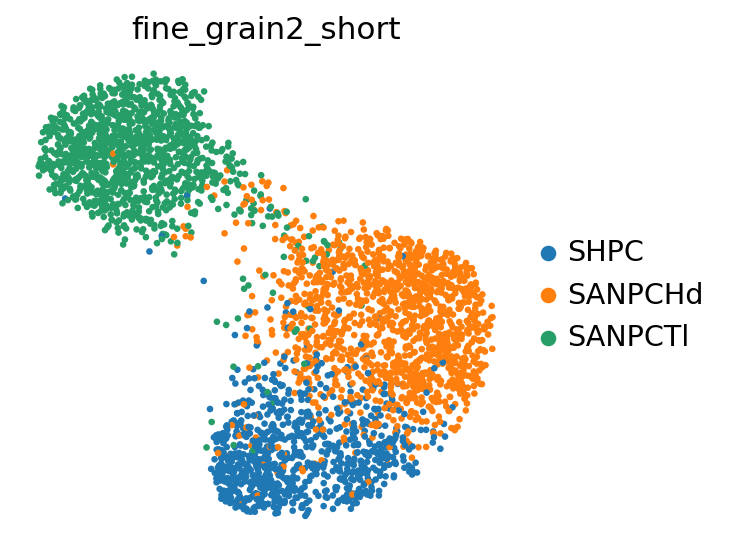

In [30]:
sc.pl.embedding(adata,basis='X_umap',
                color=f'{celltype_key}_short',frameon=False,
                show=False)
plt.savefig(f'{figdir}/VisiumHD_SA-PCs_UMAP_celltype-labels.pdf',bbox_inches="tight",dpi=300)

In [33]:
?sc.pl.embedding

# Plot genes

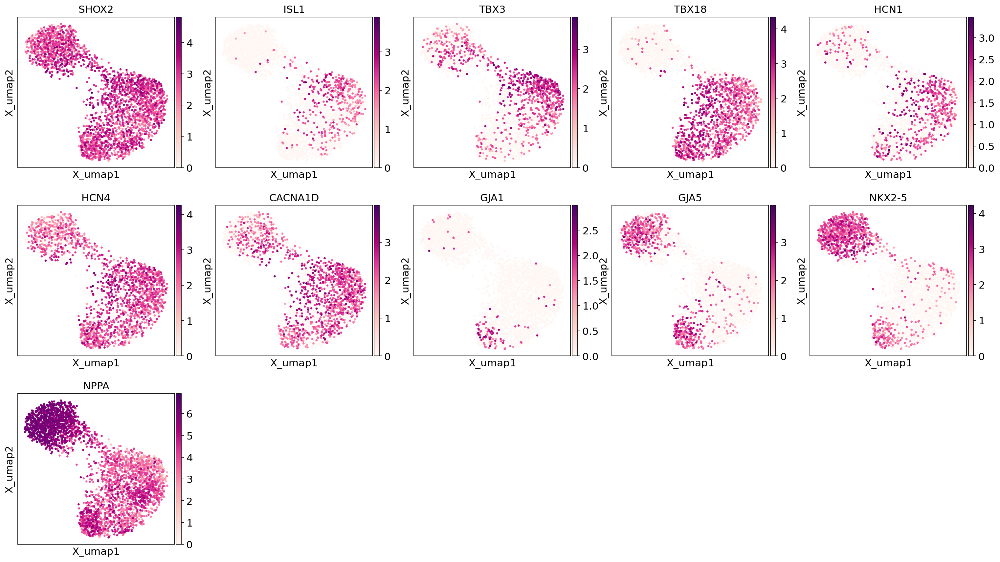

In [11]:
genes = ['SHOX2','ISL1','TBX3','TBX18',
         'HCN1','HCN4','CACNA1D',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5','NPPA',
        ]
genes = [x for x in genes if x in adata.var_names]
sc.pl.embedding(adata,basis='X_umap',
                color=genes,
               ncols=5, wspace=0.15,cmap='RdPu',vmax='p100',
                show=False
               )
plt.savefig(f'{figdir}/VisiumHD_SA-PCs_UMAP_genes.pdf', bbox_inches="tight",dpi=300)

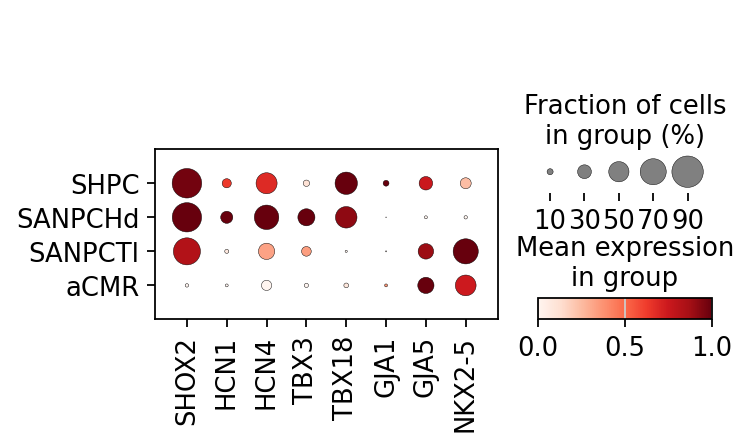

In [58]:
genes = [
        'SHOX2','HCN1','HCN4',#'CACNA1D',
        'TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5']
genes = [x for x in genes if x in adata.var_names]

celltypes_sel = ['SHPC','SANPCHd','SANPCTl','aCMR']

# sc.tl.dendrogram(adata,groupby=celltype_key)
sc.pl.dotplot(adata_acm[adata_acm.obs[f'{celltype_key}_short'].isin(celltypes_sel)],
              var_names=genes,
              groupby=f'{celltype_key}_short',
              standard_scale='var',
              dendrogram=False,
              swap_axes=False,
              show=False
             )
plt.savefig(f'{figdir}/VisiumHD_SA-PCs_SANPC_dotplot-markers.pdf', bbox_inches="tight",dpi=300)

In [36]:
?sc.pl.dotplot

# Plot per donor

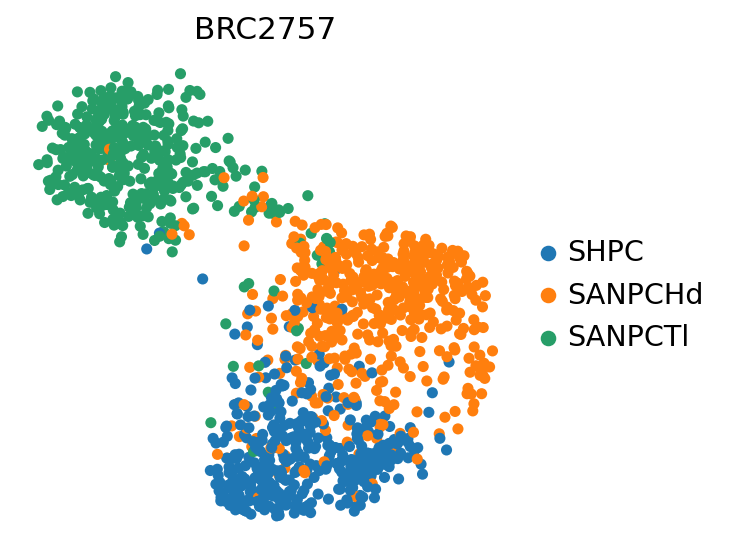

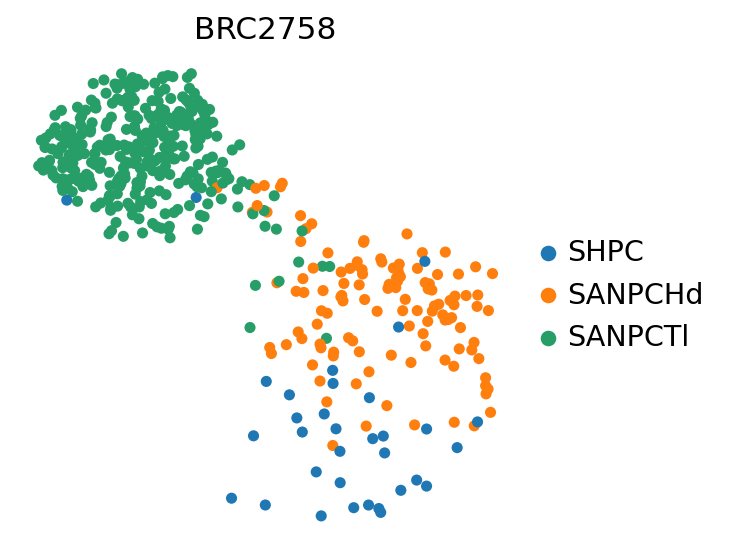

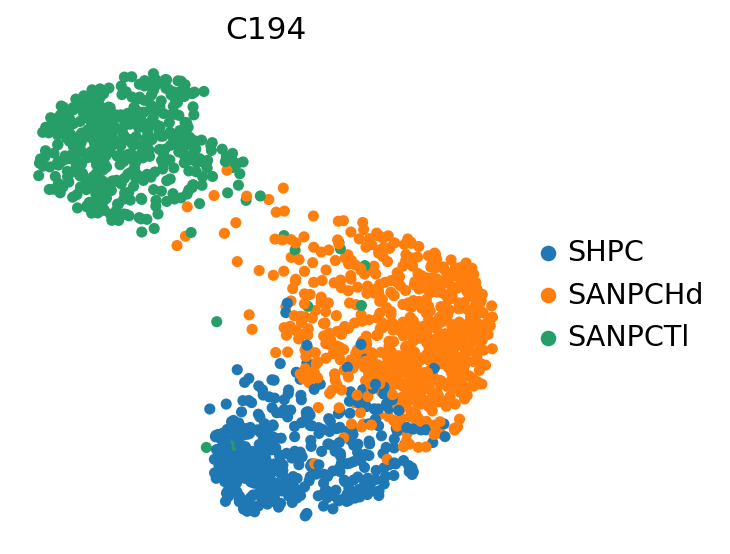

In [30]:
for donor in ['BRC2757','BRC2758','C194']:
    adata_sub = adata[adata.obs['donor']==donor].copy()
    sc.pl.embedding(adata_sub,basis='X_umap',
                color=f'{celltype_key}_short',frameon=False, title=donor,
                size = 100, show=False)
    plt.savefig(f'{figdir}/VisiumHD_SA-PCs_UMAP_celltype-labels_{donor}.pdf',bbox_inches="tight",dpi=300)

# Plot calculated axis

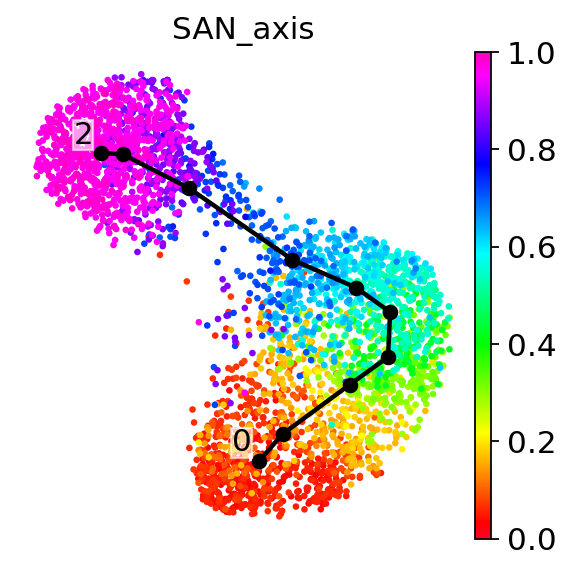

In [42]:
axis_name = 'SAN_axis'
scf.pl.graph(adata,basis='umap',color_cells=axis_name,cmap='gist_rainbow',frameon=False,show=False)
plt.savefig(f'{figdir}/VisiumHD_SA-PCs_UMAP_SANaxis.pdf',bbox_inches="tight",dpi=300)

# Plot on section

In [10]:
# https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_short_demo.html
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

import seaborn as sns
import matplotlib.pyplot as plt

def plot_section_guide(slide):
    xy = slide.obsm["spatial"]

    plt.figure(figsize=(5, 5))
    sns.scatterplot(
        x=xy[:, 0],
        y=xy[:, 1],
        s=1,
        linewidth=0
    )

    plt.gca().invert_yaxis()  # important for image coordinates
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("Section footprint")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [11]:
# read in original adata
adata_ori = sc.read_h5ad(f'/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/all_b2c_cells_filtered_celltype-sel_rm-unclassified_raw.h5ad')
adata_ori.shape

(189948, 18085)

In [12]:
# add short version of the cell type labels
celltype_key = 'fine_grain_2Feb2026'
adata_ori.obs[celltype_key] = adata_ori.obs[celltype_key].astype('str').copy()
df = pd.read_csv('/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/finegrain_name_mapping.csv')
celltype_mapping = df.set_index('Full_name')['Short_name_finalised'].to_dict()
adata_ori.obs.replace({celltype_key:celltype_mapping},inplace=True)
set(adata_ori.obs[celltype_key])

{'AVNPC',
 'ArtEC',
 'CorCapEC',
 'CorMural',
 'DASMC',
 'EPDC',
 'Endocard',
 'FB',
 'FBCOL2A1',
 'FBPITX2',
 'GVSMC',
 'ILC',
 'LymphEC',
 'MPLYVE1',
 'MacCX3',
 'MesEpiC',
 'Mono',
 'NK',
 'ParaN',
 'SANPCHd',
 'SANPCTl',
 'SHPC',
 'SchwC',
 'SympN',
 'VCSDist',
 'VCSProx',
 'ValveEC',
 'ValveIC',
 'VenEC',
 'aCML',
 'aCMNeur',
 'aCMR',
 'aCMTrans',
 'vCMC',
 'vCMT'}

In [13]:
adata_ori.obs[celltype_key].value_counts()

fine_grain_2Feb2026
vCMC        70002
FB          24614
vCMT        16973
VCSProx     13953
ValveIC     12968
aCMR         9684
aCML         8366
AVNPC        5661
GVSMC        5380
FBCOL2A1     3173
DASMC        2461
LymphEC      2169
VCSDist      1794
aCMTrans     1604
SANPCHd      1319
SANPCTl      1198
MesEpiC      1072
CorMural     1056
SHPC          863
ArtEC         724
SympN         700
MPLYVE1       683
SchwC         503
VenEC         468
Endocard      392
ValveEC       385
EPDC          368
CorCapEC      340
FBPITX2       236
ILC           212
ParaN         207
NK            134
aCMNeur       123
MacCX3        101
Mono           62
Name: count, dtype: int64

In [16]:
# add SANaxis
axis_name = 'SAN_axis'
adata_ori.obs.loc[adata.obs_names,axis_name] = adata.obs[axis_name].copy()

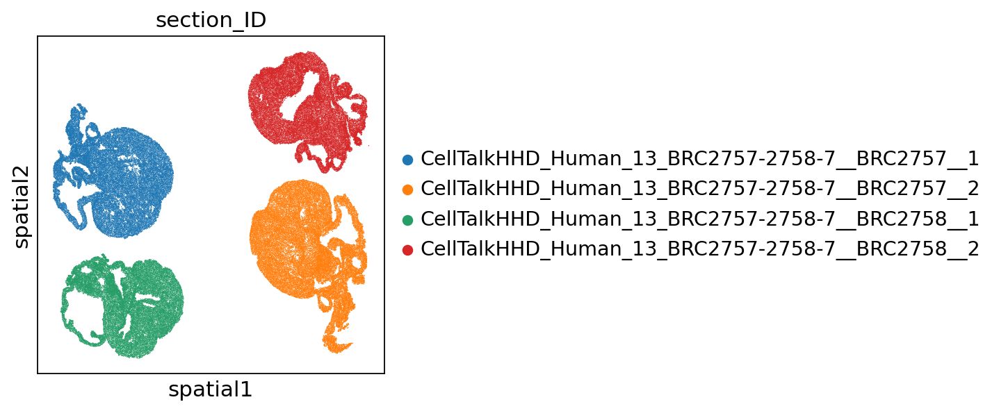

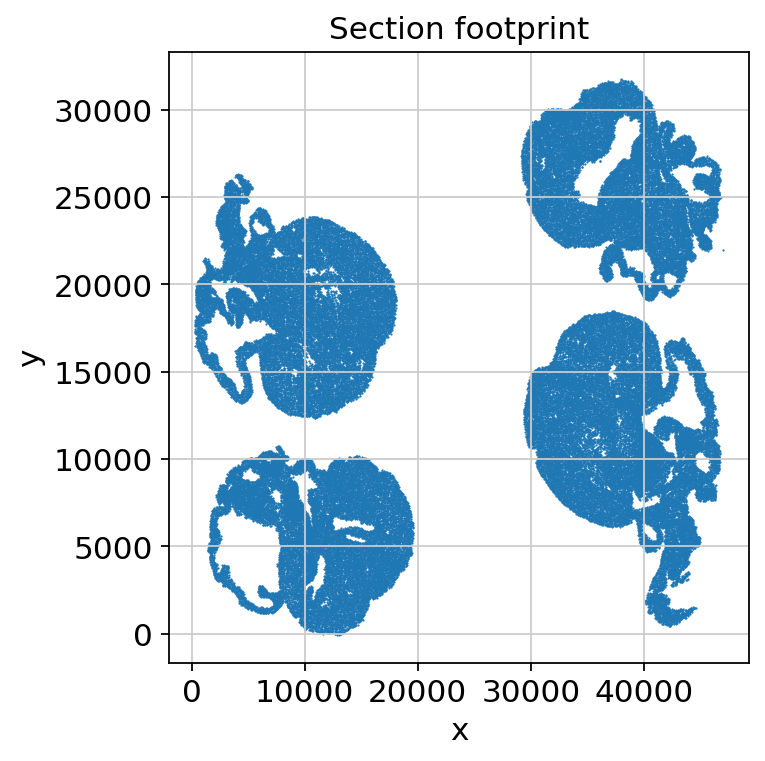

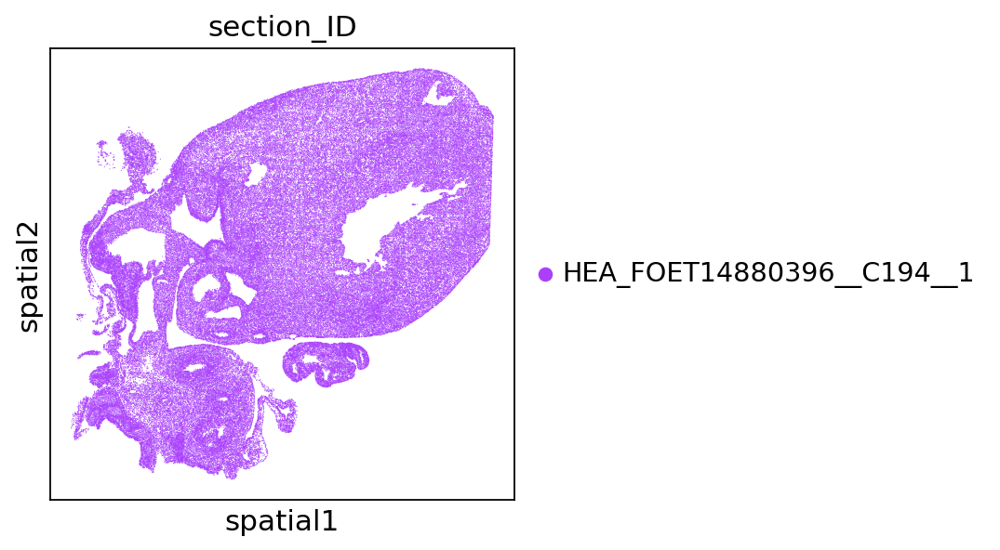

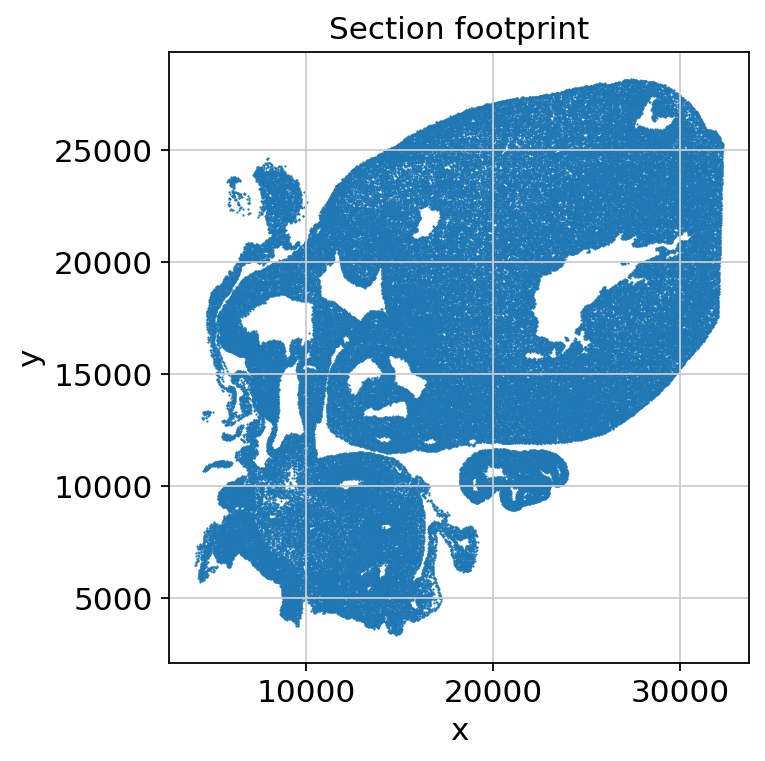

{'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__1', 'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__2', 'HEA_FOET14880396__C194__1', 'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__1', 'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__2'}


In [66]:
for sample_id in sample_list:
    # subsetting
    slide = select_slide(adata_ori, sample_id, s_col='library')
    sc.pl.embedding(slide,basis='spatial',color='section_ID')
    plot_section_guide(slide)
print(set(adata_ori.obs['section_ID']))

In [12]:
crop_coords = {
    'HEA_FOET14880396__C194__1':None,
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__1':(-1000, 19000, 11000, 27000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__2':(28000, 49000, -1000, 19000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__1':(-1000, 20000, -1000, 12000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__2':(28000, 49000, 18000, 33000),
}

crop_coords_SAN = {
    'HEA_FOET14880396__C194__1':(5000, 10000, 9000, 16000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__1':(-1000, 9000, 17000, 25000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2757__2':(38000, 49000, 4000, 13000),
    'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__1':(1000, 9000, 5000, 10000),
    # 'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__2':None,
}

section_list = list(crop_coords.keys())
section_list_SAN = list(crop_coords_SAN.keys())

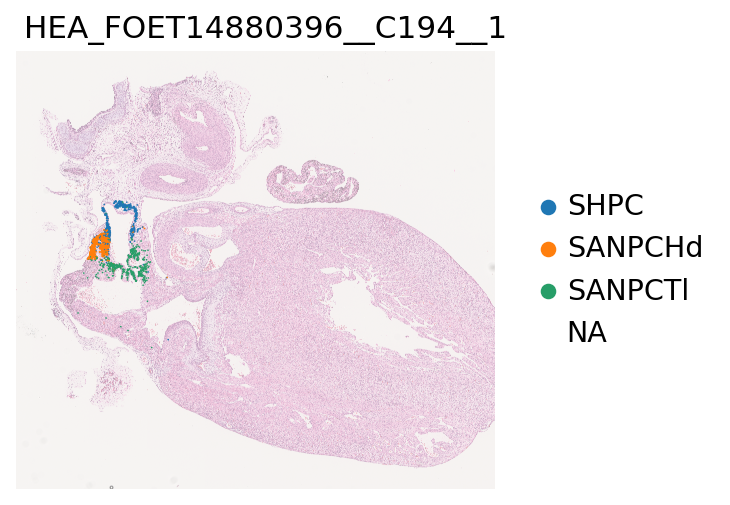

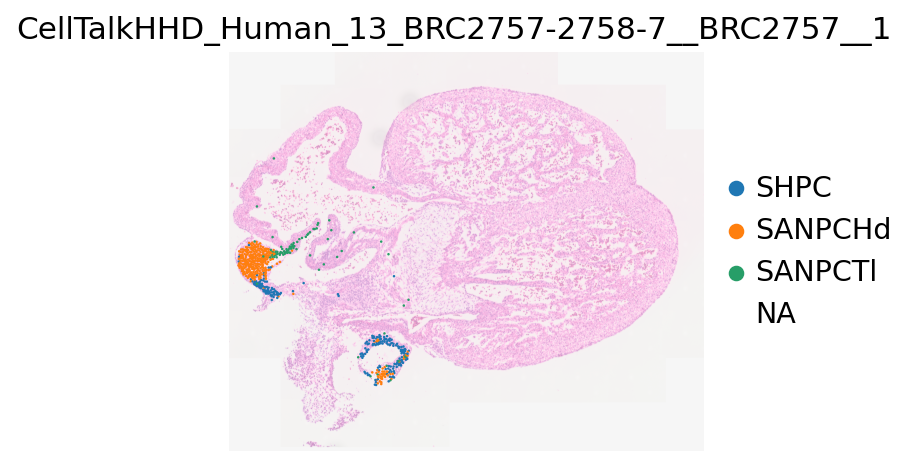

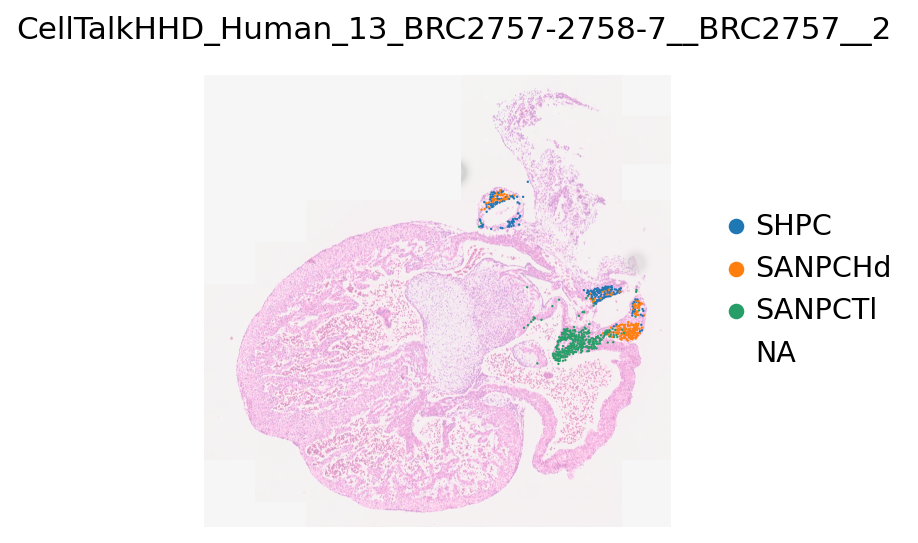

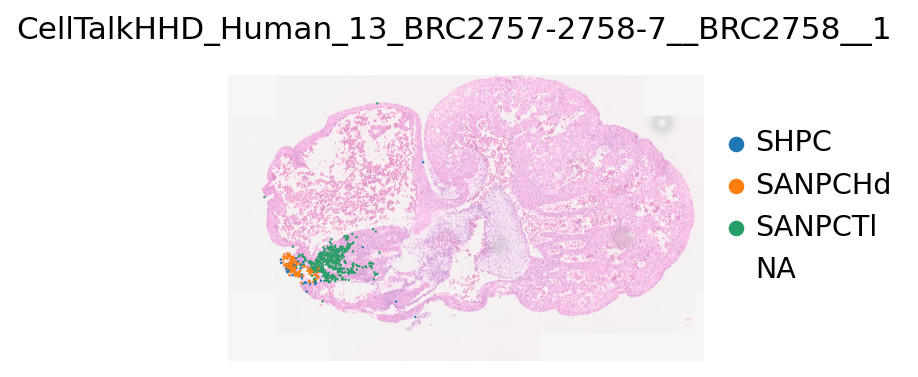

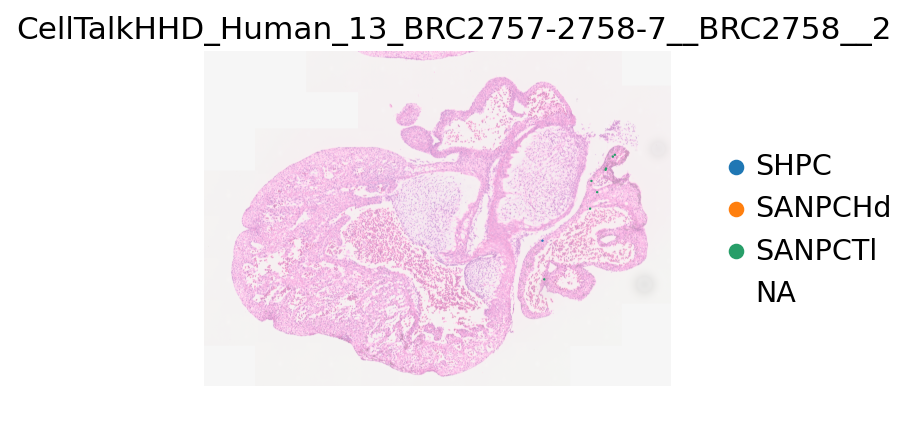

In [91]:
for section_id in section_list:
    mask = adata.obs['section_ID'] == section_id
    library = adata[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    sc.pl.spatial(slide, color=f'{celltype_key}_short',
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=100, frameon=False,
                  title=section_id,crop_coord=crop_coords[section_id],
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SA-PCs_section_celltype-labels_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

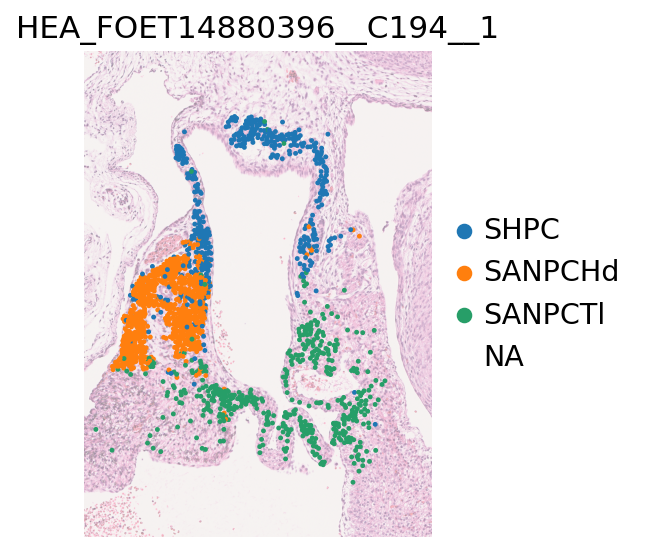

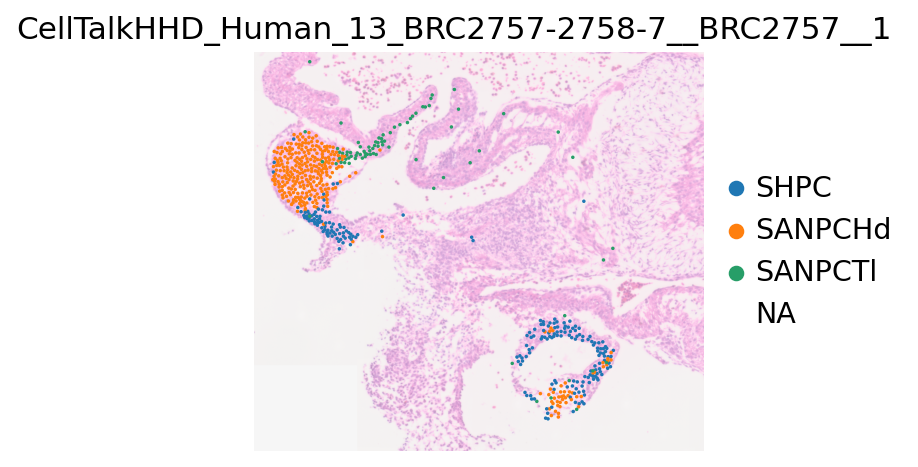

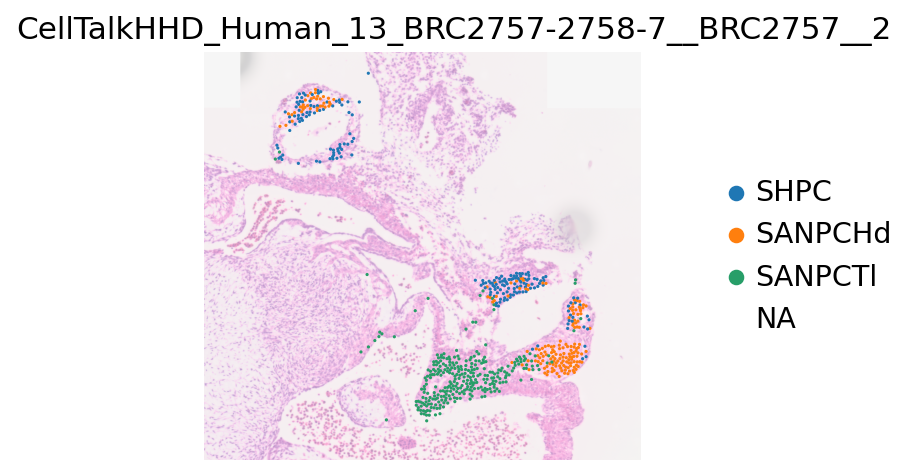

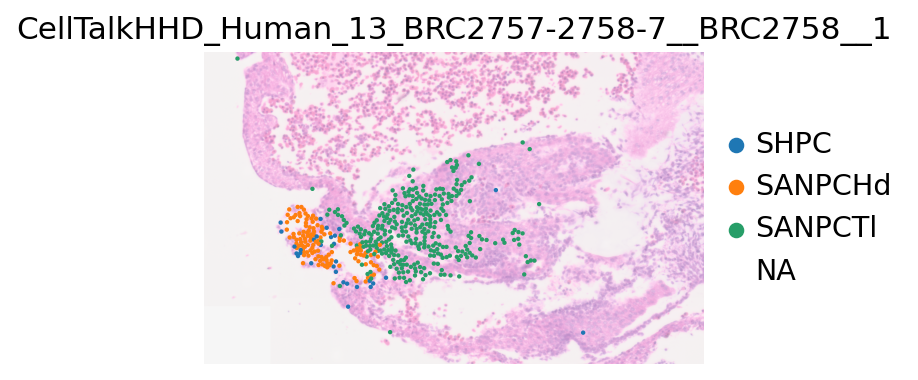

In [24]:
for section_id in section_list_SAN:
    mask = adata.obs['section_ID'] == section_id
    library = adata[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    sc.pl.spatial(slide, color=f'{celltype_key}_short',
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=70, frameon=False,
                  title=section_id,crop_coord=crop_coords_SAN[section_id],
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SA-PCs_section_SAN-zoom_celltype-labels_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

In [18]:
set(adata_ori.obs['fine_grain_2Feb2026_mod'])

{'ArterialEndothelialCells',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesNeurotropic',
 'AtrialCardiomyocytesRight',
 'AtrialCardiomyocytesTransitional',
 'AtrioventricularNodePacemakerCells',
 'CoronaryCapillaryEndothelialCells',
 'CoronaryMuralCells',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 'EpicardiumDerivedCells',
 'Erythrocytes',
 'Fibroblasts',
 'FibroblastsCOL2A1pos',
 'FibroblastsPITX2pos',
 'GreatVesselSmoothMuscleCells',
 'InnateLymphoidCells',
 'LymphaticEndothelialCells',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MesothelialEpicardialCells',
 'Monocytes',
 'NaturalKillerCells',
 'ParasympatheticNeurons',
 'SchwannCells',
 'SinoatrialNodePacemakerCellsHead',
 'SinoatrialNodePacemakerCellsTail',
 'SinusHornPacemakerCells',
 'SkeletalMuscleLike',
 'SympatheticNeurons',
 'ValveEndothelialCells',
 'ValveInterstitialCells',
 'VenousEndothelialCells',
 'VentricularCardiomyocytesCompact',
 'VentricularCardiomyocytesTrabeculated',
 'VentricularCon

In [23]:
adata_ori

AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'scVI_latent_n-layers-3_leiden_0.2', 'scVI_latent_n-layers-3_leiden_0.3', 'scVI_latent_n-layers-3_leiden_0.4', 'scVI_latent_n-layers-3_leiden_0.5', 'scVI_latent_n-layers-3_leiden_0.8', 'scVI_latent_n-layers-3_leiden_1.0', 'scVI_latent_n-layers-3_leiden_1.5', 'scVI_latent_n-layers-3_leiden_2.0', 'scVI_latent_n-layers-3_leiden_3.0', 'scVI_latent_n-layers-3_leiden_4.0', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-sc

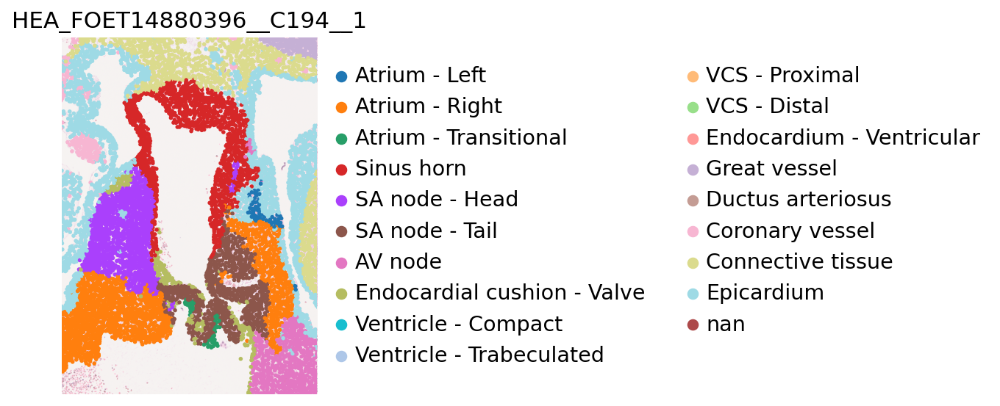

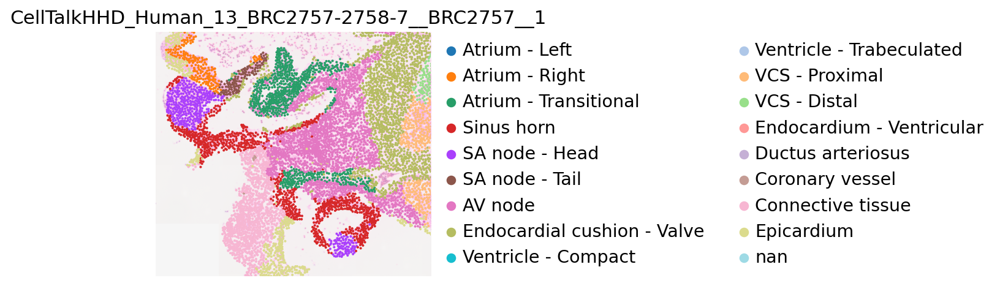

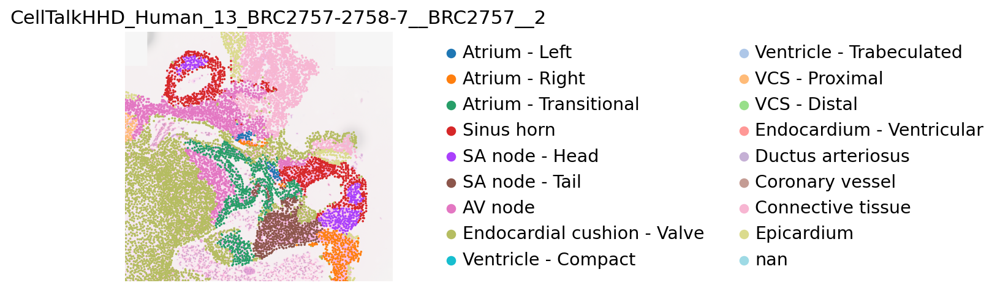

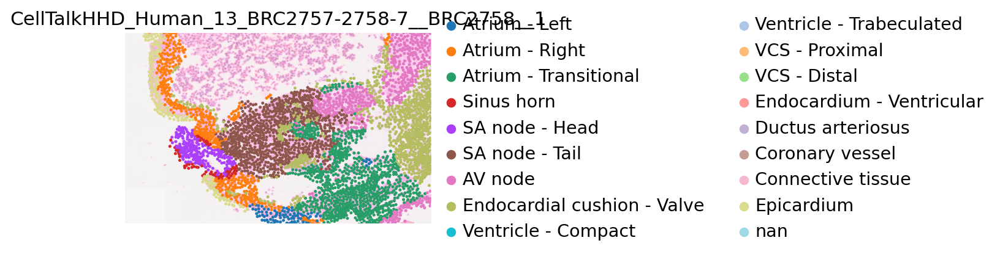

In [24]:
for section_id in section_list_SAN:
    mask = adata.obs['section_ID'] == section_id
    library = adata[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    sc.pl.spatial(slide, color='niche_fine_Mar2026', 
                  # groups=[
                  #     'SympatheticNeurons',
                  #     'ParasympatheticNeurons',
                  #     'SchwannCells',
                  #     
                  # ],
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=80, frameon=False,
                  title=section_id,crop_coord=crop_coords_SAN[section_id],
                  show=False
                 )
    # plt.savefig(f'{figdir}/VisiumHD_SA-PCs_section_SAN-zoom_celltype-labels_{section_id}.pdf',
    #             bbox_inches="tight",dpi=300)

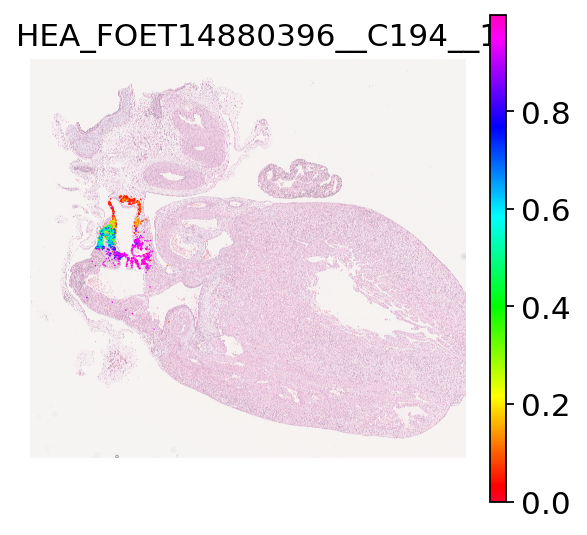

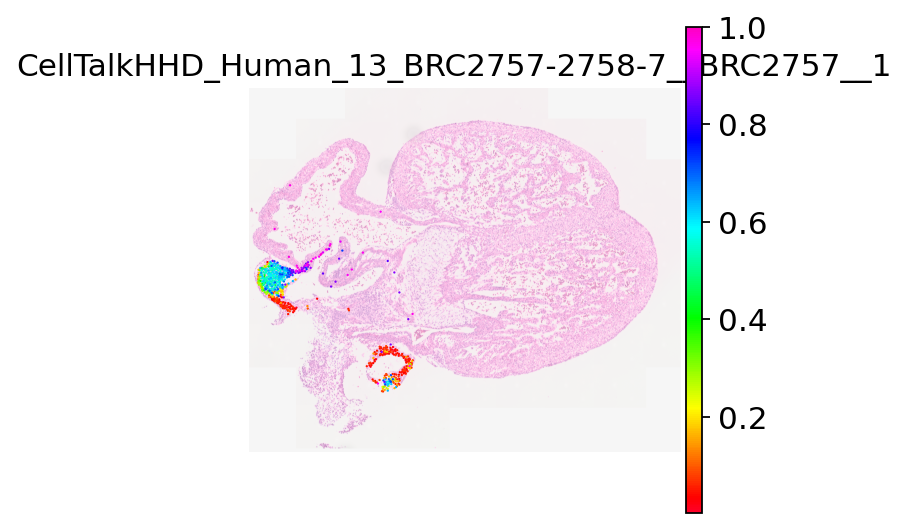

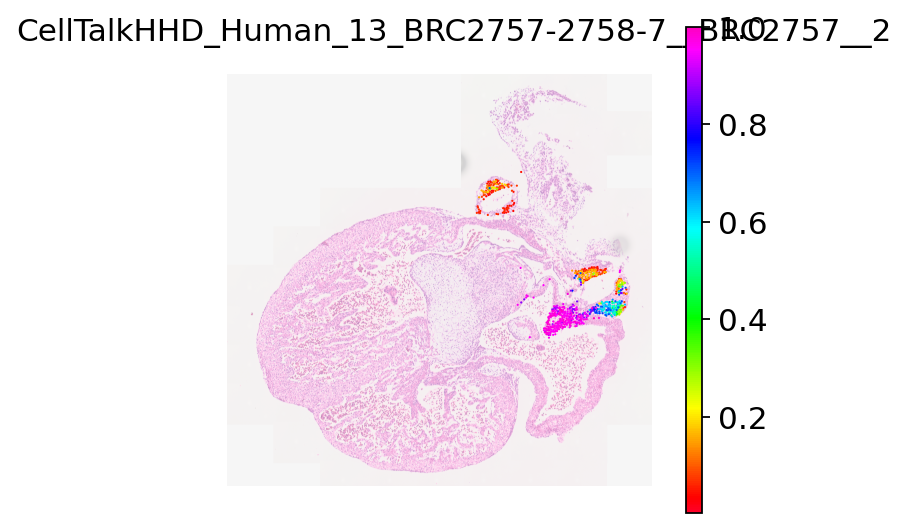

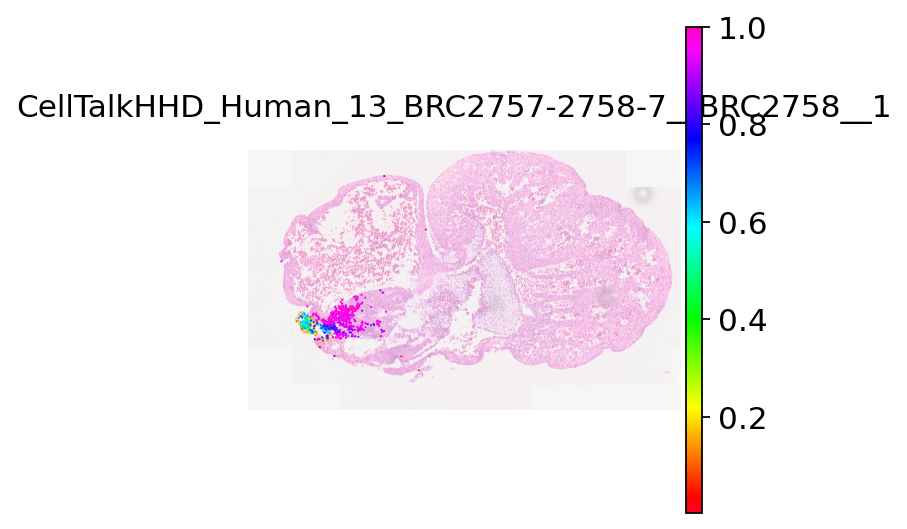

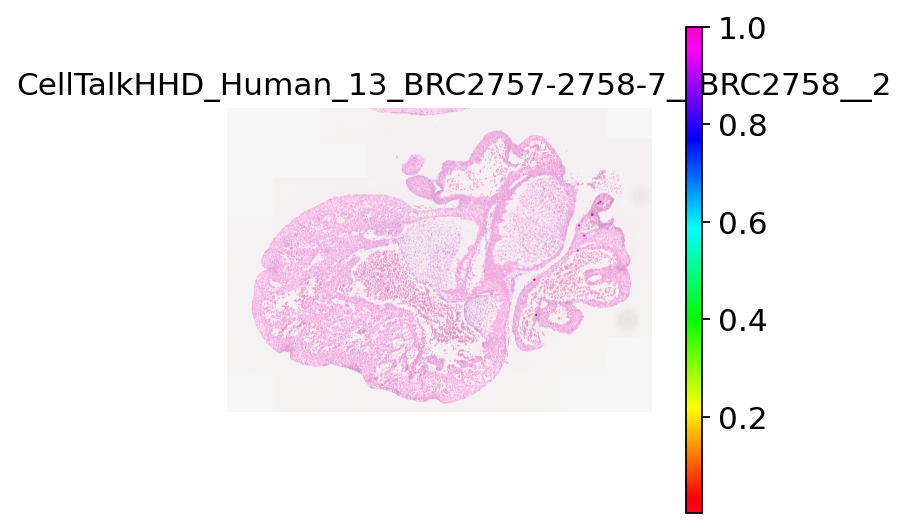

In [92]:
for section_id in section_list:
    mask = adata.obs['section_ID'] == section_id
    library = adata[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    sc.pl.spatial(slide, color=axis_name, cmap='gist_rainbow',
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=100, frameon=False,
                  title=section_id,crop_coord=crop_coords[section_id],
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SA-PCs_section_SANaxis_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

KeyError: 'CellTalkHHD_Human_13_BRC2757-2758-7__BRC2758__2'

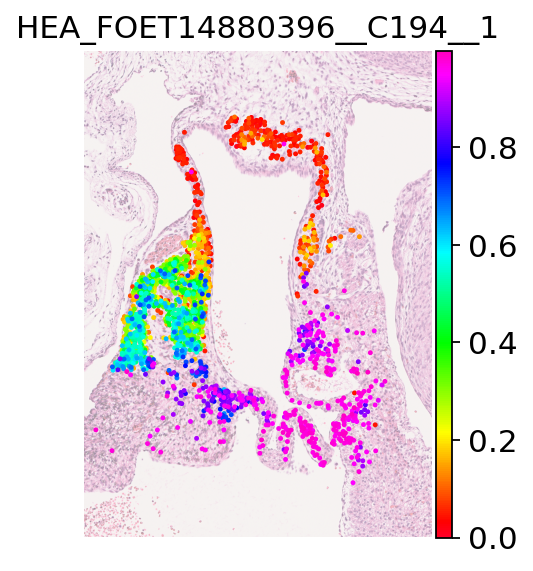

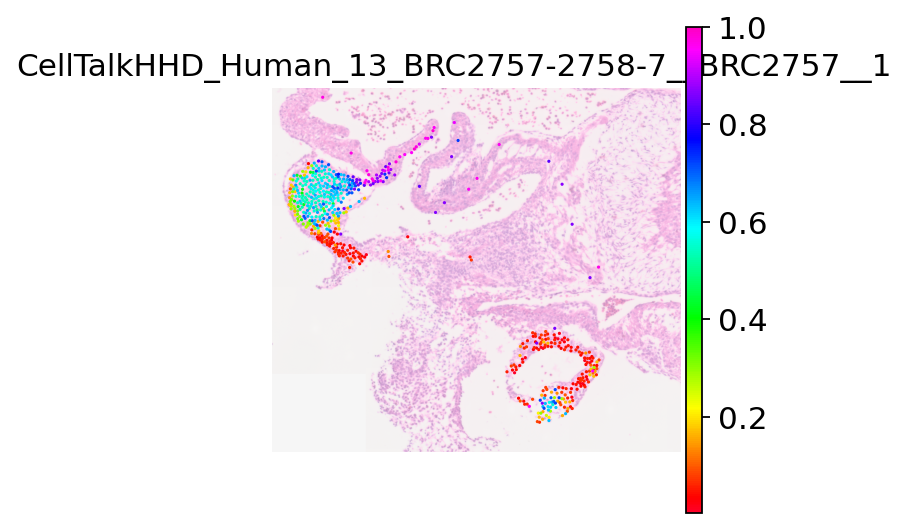

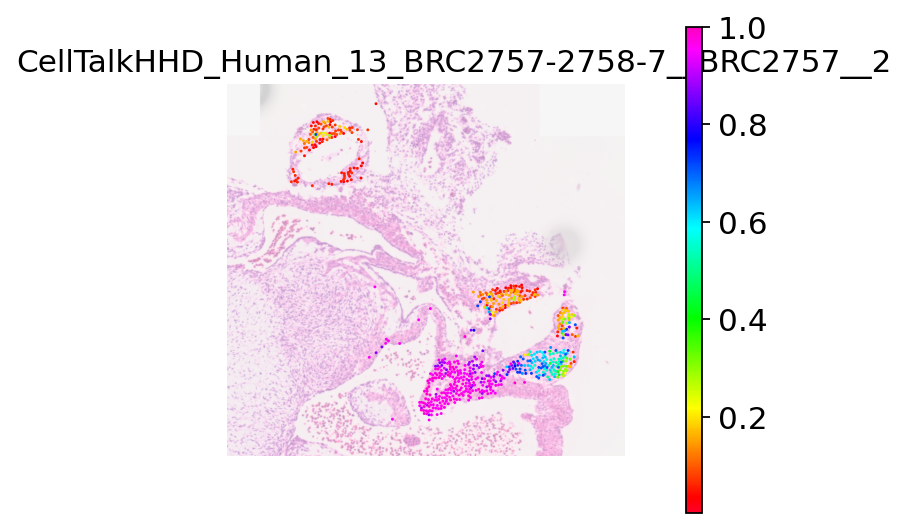

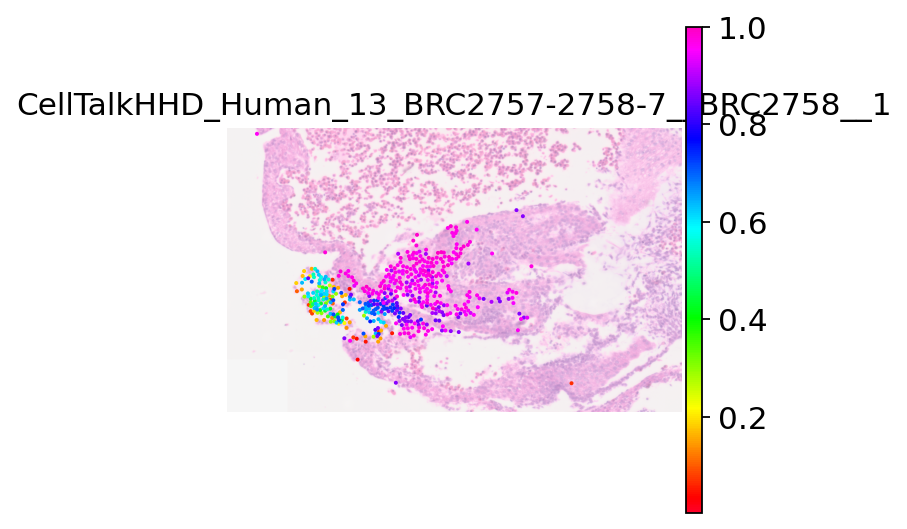

In [25]:
for section_id in section_list:
    mask = adata.obs['section_ID'] == section_id
    library = adata[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    sc.pl.spatial(slide, color=axis_name, cmap='gist_rainbow',
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=70, frameon=False,
                  title=section_id,crop_coord=crop_coords_SAN[section_id],
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SA-PCs_section_SAN-zoom_SANaxis_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

# SANPCs and ParaN

In [14]:
import matplotlib.colors as mcolors

highlight_palette = {
    'ParaN': mcolors.to_rgba('deeppink', 0.95),
    'SHPC': mcolors.to_rgba('#1f77b4', 0.15),
    'SANPCHd': mcolors.to_rgba('#ff7f0e', 0.15),
    'SANPCTl': mcolors.to_rgba('#2ca02c', 0.15),
    'others': mcolors.to_rgba('lightgrey', 0),
}
plot_col = celltype_key

adata_ori.obs['plot_col'] = adata_ori.obs[plot_col].copy()
adata_ori.obs['plot_col'] = [x if x in highlight_palette.keys() else 'others' for x in adata_ori.obs['plot_col']]
adata_ori.obs['plot_col'] = pd.Categorical(
    adata_ori.obs['plot_col'],
    categories=highlight_palette.keys(),
    ordered=True
)
print(adata_ori.obs['plot_col'].cat.categories)
adata_ori.obs['plot_col'].value_counts()

Index(['ParaN', 'SHPC', 'SANPCHd', 'SANPCTl', 'others'], dtype='object')


plot_col
others     186361
SANPCHd      1319
SANPCTl      1198
SHPC          863
ParaN         207
Name: count, dtype: int64

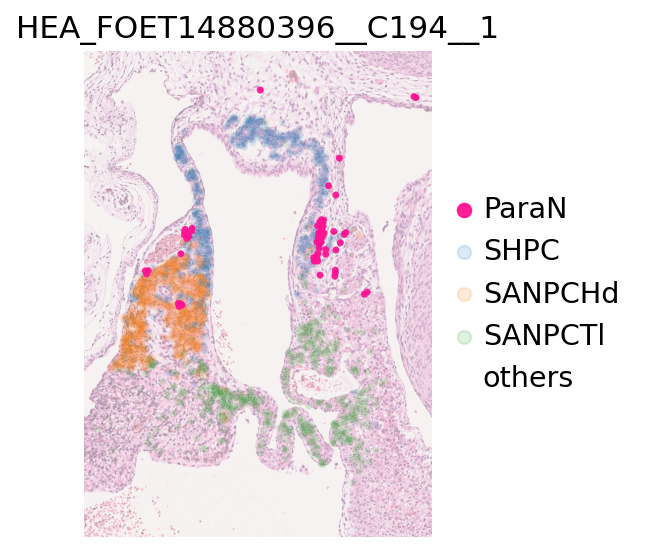

In [33]:
for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]
    
    sc.pl.spatial(slide, color='plot_col', palette=highlight_palette,
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=100, frameon=False,
                  title=section_id,crop_coord=crop_coords_SAN[section_id],
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in_SANPC-ParaN_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

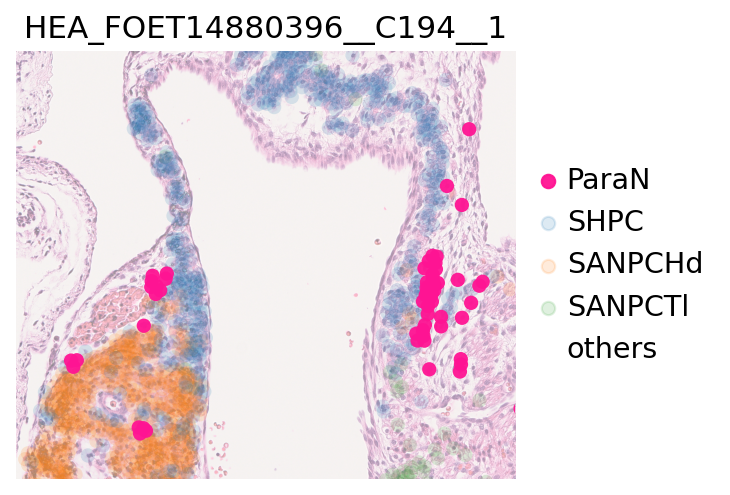

In [20]:
for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]
    
    sc.pl.spatial(slide, color='plot_col', palette=highlight_palette,
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=0.5,spot_size=100, frameon=False,
                  title=section_id,crop_coord=(5500, 9000, 10000, 13000),
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in-further_SANPC-ParaN_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

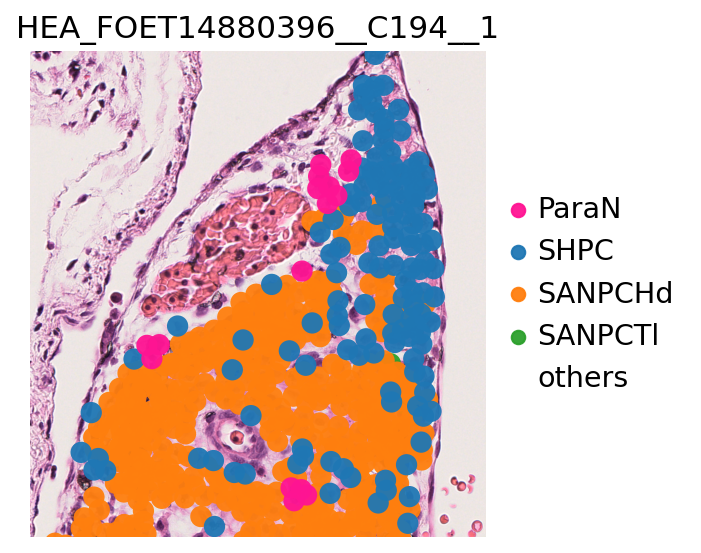

In [30]:
highlight_palette = {
    'ParaN': mcolors.to_rgba('deeppink', 0.95),
    'SHPC': mcolors.to_rgba('#1f77b4', 0.95),
    'SANPCHd': mcolors.to_rgba('#ff7f0e', 0.95),
    'SANPCTl': mcolors.to_rgba('#2ca02c', 0.95),
    'others': mcolors.to_rgba('lightgrey', 0),
}

for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]
    
    sc.pl.spatial(slide, color='plot_col', palette=highlight_palette,
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=1.0,spot_size=70, frameon=False,
                  title=section_id,crop_coord=(5500, 7000, 11200, 12800),
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in-further1_SANPC-ParaN_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

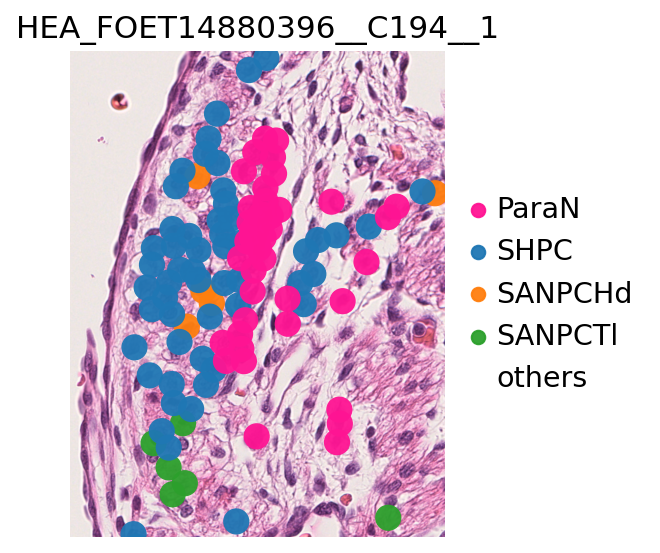

In [34]:
highlight_palette = {
    'ParaN': mcolors.to_rgba('deeppink', 0.95),
    'SHPC': mcolors.to_rgba('#1f77b4', 0.95),
    'SANPCHd': mcolors.to_rgba('#ff7f0e', 0.95),
    'SANPCTl': mcolors.to_rgba('#2ca02c', 0.95),
    'others': mcolors.to_rgba('lightgrey', 0),
}

for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]
    
    sc.pl.spatial(slide, color='plot_col', palette=highlight_palette,
                  img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer",
                  alpha_img=1.0,spot_size=70, frameon=False,
                  title=section_id,crop_coord=(7900, 8900, 11200, 12500),
                  show=False
                 )
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in-further2_SANPC-ParaN_{section_id}.pdf',
                bbox_inches="tight",dpi=300)

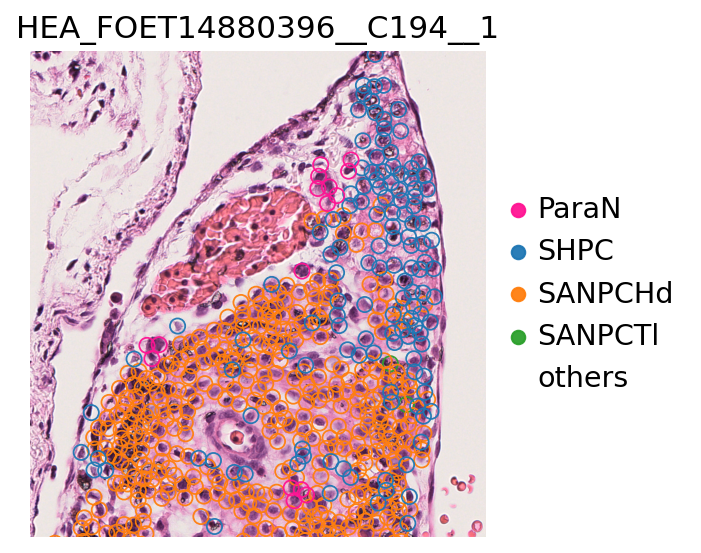

In [36]:
import matplotlib.pyplot as plt

highlight_palette = {
    'ParaN': mcolors.to_rgba('deeppink', 0.95),
    'SHPC': mcolors.to_rgba('#1f77b4', 0.95),
    'SANPCHd': mcolors.to_rgba('#ff7f0e', 0.95),
    'SANPCTl': mcolors.to_rgba('#2ca02c', 0.95),
    'others': mcolors.to_rgba('lightgrey', 0),
}

for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]

    ax = sc.pl.spatial(
        slide,
        color='plot_col',
        palette=highlight_palette,
        img_key="0.3_mpp_150_buffer",
        basis="spatial_cropped_150_buffer",
        alpha_img=1.0,
        spot_size=50,
        frameon=False,
        title=section_id,
        crop_coord=(5500, 7000, 11200, 12800),
        show=False
    )

    if isinstance(ax, list):
        ax = ax[0]

    coll = ax.collections[0]   # <- the PatchCollection

    edgecols = [highlight_palette.get(v, "lightgrey") for v in slide.obs["plot_col"].astype(str)]

    coll.set_facecolor("none")
    coll.set_edgecolor(edgecols)
    coll.set_linewidth(0.8)
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in-further1_SANPC-ParaN_edge_{section_id}.pdf',
                    bbox_inches="tight",dpi=300)
    plt.show()

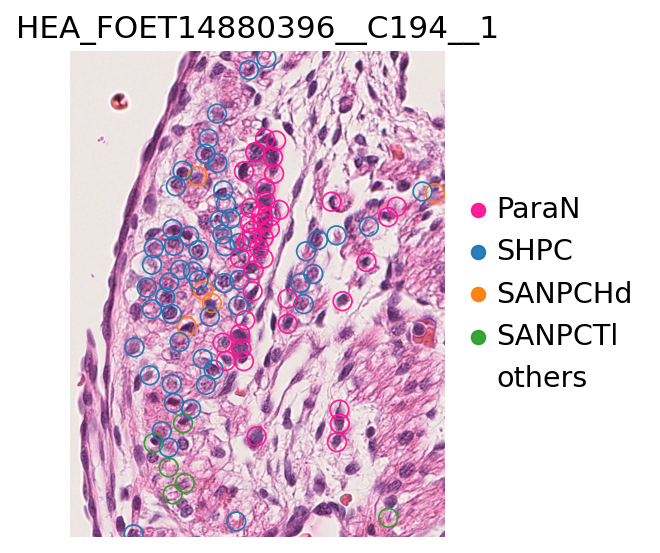

In [37]:
import matplotlib.pyplot as plt

highlight_palette = {
    'ParaN': mcolors.to_rgba('deeppink', 0.95),
    'SHPC': mcolors.to_rgba('#1f77b4', 0.95),
    'SANPCHd': mcolors.to_rgba('#ff7f0e', 0.95),
    'SANPCTl': mcolors.to_rgba('#2ca02c', 0.95),
    'others': mcolors.to_rgba('lightgrey', 0),
}

for section_id in ['HEA_FOET14880396__C194__1']:
    mask = adata_ori.obs['section_ID'] == section_id
    library = adata_ori[mask, :].obs['library'].unique()
    if len(library) != 1:
        raise ValueError(f"Expected one library, found: {library}")
    # subsetting
    slide = select_slide(adata_ori, library[0], s_col='library')
    obsnames_ordered = slide.obs.sort_values('plot_col',ascending=False).index
    slide = slide[obsnames_ordered]

    ax = sc.pl.spatial(
        slide,
        color='plot_col',
        palette=highlight_palette,
        img_key="0.3_mpp_150_buffer",
        basis="spatial_cropped_150_buffer",
        alpha_img=1.0,
        spot_size=50,
        frameon=False,
        title=section_id,
        crop_coord=(7900, 8900, 11200, 12500),
        show=False
    )

    if isinstance(ax, list):
        ax = ax[0]

    coll = ax.collections[0]   # <- the PatchCollection

    edgecols = [highlight_palette.get(v, "lightgrey") for v in slide.obs["plot_col"].astype(str)]

    coll.set_facecolor("none")
    coll.set_edgecolor(edgecols)
    coll.set_linewidth(0.8)
    plt.savefig(f'{figdir}/VisiumHD_SAN-zoom-in-further2_SANPC-ParaN_edge_{section_id}.pdf',
                    bbox_inches="tight",dpi=300)
    plt.show()